<a href="https://colab.research.google.com/github/danielmarek22/onboard-rock-segmentation/blob/main/TrainingPipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Extraterestial rock segmentation

In [ ]:
#Fix the enviroment in case something goes wrong

# Check libcudnn8 version
!apt-cache policy libcudnn8

# Install latest version
!apt install --allow-change-held-packages libcudnn8=8.4.1.50-1+cuda11.6

# Export env variables
!export PATH=/usr/local/cuda-11.4/bin${PATH:+:${PATH}}
!export LD_LIBRARY_PATH=/usr/local/cuda-11.4/lib64:$LD_LIBRARY_PATH
!export LD_LIBRARY_PATH=/usr/local/cuda-11.4/include:$LD_LIBRARY_PATH
!export LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/usr/local/cuda/extras/CUPTI/lib64

# Install neccessary packages
!pip install tflite-model-maker
!pip install pycocotools
!pip install opencv-python-headless
!pip install -U segmentation-models
!pip install mlflow
!pip uninstall -y tensorflow && pip install -q tensorflow
!pip install -U scipy
!pip install latex
!pip install -U matplotlib

# Install latex for pretty plots
!sudo apt install cm-super dvipng texlive-latex-extra texlive-latex-recommended

In [ ]:
# Check which GPU is available
!nvidia-smi

In [ ]:
# This var is needed by sm models to work
%env SM_FRAMEWORK=tf.keras

# Basic necessary imports
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
import cv2
import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage
import segmentation_models as sm
from skimage import color

# Set params for plots with pyploy
plt.style.use('seaborn-pastel')
params = {"ytick.color" : "black",
          "xtick.color" : "black",
          "axes.labelcolor" : "black",
          "axes.edgecolor" : "black",
          "text.usetex" : True,
          "font.family" : "serif",
          "font.serif" : ["Computer Modern Serif"]}
plt.rcParams.update(params)


env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


<ipython-input-1-0bf37e7ca7f8>:19: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-pastel')


In [ ]:
!databricks configure --host https://community.cloud.databricks.com/

# Connecting with database hosted on community edition of databricks
import mlflow
mlflow.set_tracking_uri("databricks")
mlflow.set_experiment("/Users/danimar301@student.polsl.pl/Extraterrestial-Rock-Segmentation")

Username: danimar301@student.polsl.pl
Password: 
Repeat for confirmation: 


<Experiment: artifact_location='dbfs:/databricks/mlflow-tracking/1048085717579938', creation_time=1668775123782, experiment_id='1048085717579938', last_update_time=1673965167011, lifecycle_stage='active', name='/Users/danimar301@student.polsl.pl/Extraterrestial-Rock-Segmentation', tags={'mlflow.experiment.sourceName': '/Users/danimar301@student.polsl.pl/Extraterrestial-Rock-Segmentation',
 'mlflow.experimentType': 'MLFLOW_EXPERIMENT',
 'mlflow.ownerEmail': 'danimar301@student.polsl.pl',
 'mlflow.ownerId': '7796760964070965'}>

In [ ]:
# Only run these cells when uploading files from collab - this dataset is around 5gb so it is possible
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#Unzip all of the data
!unzip gdrive/My\ Drive/eng_data/data.zip # Rendered images and ground
!unzip gdrive/My\ Drive/eng_data/data_test.zip  # Real images
!unzip gdrive/My\ Drive/eng_data/clean.zip # Clean masks dataset

In [ ]:
# Renders where the input image and corresponding masks are not the same
bad_renders = ['0009', '0260', '0319', '5389', 
               '6197', '2396', '7549', '5771', 
               '2769', '5392', '7534', '8067',
               '3123']

for render in bad_renders:
  os.system("rm render/render{}.png".format(render))
  os.system("rm ground/ground{}.png".format(render))
  os.system("rm clean/clean{}.png".format(render))

In [ ]:
# Prepare paths of input images and target segmentation masks
input_dir = "./render/"
target_dir = "./ground/"

test_input_dir = "./real_moon_images/input/"
test_target_dir = "./real_moon_images/target/."

img_size = (320, 320)          #This is the biggest image I could get
num_classes = 4
batch_size = 16                # Bigger sizes sometimes couse crashes due to low memory
lower_color_threshold = 100

# Initialize in order to prevent error when loading model for inference only
run_id = 0

# Sorting image names in input folder
input_img_paths = sorted([
    os.path.join(input_dir, fname)
    for fname in os.listdir(input_dir)
    if fname.endswith(".png")
])

#Sorting mask names in target folder
target_img_paths = sorted([
    os.path.join(target_dir, fname)
    for fname in os.listdir(target_dir)
    if fname.endswith(".png") and not fname.startswith(".")
])

# Sorting images in real data input folder
input_real_paths = sorted([
    os.path.join(test_input_dir, fname)
    for fname in os.listdir(test_input_dir)
    if fname.endswith(".png")
])

# Sorting images in real data targte folder
target_real_paths = sorted([
    os.path.join(test_target_dir, fname)
    for fname in os.listdir(test_target_dir)
    if fname.endswith(".png")
])

print("Number of input samples:", len(input_img_paths))
print("Number of target samples:", len(target_img_paths))

#Input and target images are now corresponding
for input_path, target_path in zip(input_img_paths[:10], target_img_paths[:10]):
    print(input_path, "|", target_path)


print("Number of real input samples", len(input_real_paths))
print("Nmber of real target samples", len(target_real_paths))
for input_path, target_path in zip(input_real_paths[:10], target_real_paths[:10]):
    print(input_path, "|", target_path)

Number of input samples: 9753
Number of target samples: 9753
./render/render0001.png | ./ground/ground0001.png
./render/render0002.png | ./ground/ground0002.png
./render/render0003.png | ./ground/ground0003.png
./render/render0004.png | ./ground/ground0004.png
./render/render0005.png | ./ground/ground0005.png
./render/render0006.png | ./ground/ground0006.png
./render/render0007.png | ./ground/ground0007.png
./render/render0008.png | ./ground/ground0008.png
./render/render0010.png | ./ground/ground0010.png
./render/render0011.png | ./ground/ground0011.png
Number of real input samples 36
Nmber of real target samples 36
./real_moon_images/input/PCAM1.png | ./real_moon_images/target/./g_PCAM1.png
./real_moon_images/input/PCAM10.png | ./real_moon_images/target/./g_PCAM10.png
./real_moon_images/input/PCAM11.png | ./real_moon_images/target/./g_PCAM11.png
./real_moon_images/input/PCAM12.png | ./real_moon_images/target/./g_PCAM12.png
./real_moon_images/input/PCAM13.png | ./real_moon_images/targ

In [ ]:
clean_target_dir = "./clean/"
ground_target_dir = "./ground/"

# Sorting image names in clean folder
clean_target_img_paths = sorted([
    os.path.join(clean_target_dir, fname)
    for fname in os.listdir(clean_target_dir)
    if fname.endswith(".png")
])

# Sorting images in ground folder
ground_target_img_paths = sorted([
    os.path.join(ground_target_dir, fname)
    for fname in os.listdir(ground_target_dir)
    if fname.endswith(".png")
])


print("Number of clean target samples:", len(input_img_paths))
print("Number of ground target samples:", len(target_img_paths))

for input_path in clean_target_img_paths[:10]:
    print(input_path)

for input_path in ground_target_img_paths[:10]:
    print(input_path)


Number of clean target samples: 9753
Number of ground target samples: 9753
./clean/clean0001.png
./clean/clean0002.png
./clean/clean0003.png
./clean/clean0004.png
./clean/clean0005.png
./clean/clean0006.png
./clean/clean0007.png
./clean/clean0008.png
./clean/clean0010.png
./clean/clean0011.png
./ground/ground0001.png
./ground/ground0002.png
./ground/ground0003.png
./ground/ground0004.png
./ground/ground0005.png
./ground/ground0006.png
./ground/ground0007.png
./ground/ground0008.png
./ground/ground0010.png
./ground/ground0011.png


Input image: 


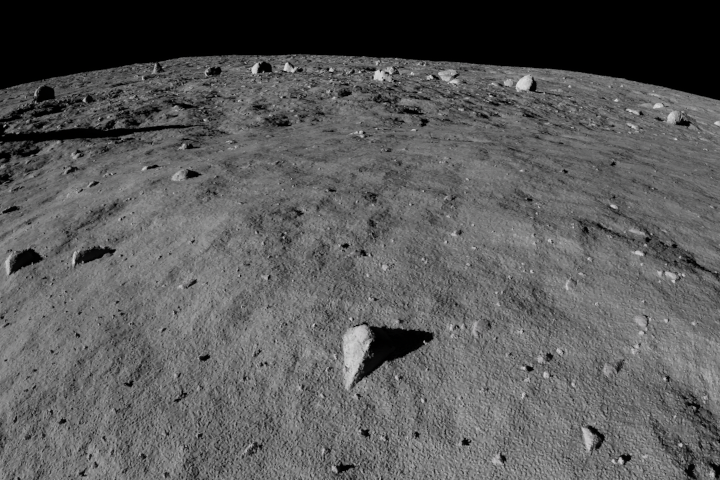

Target img:                            Clean image:                            Cleared by me:


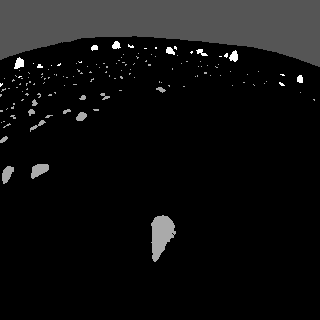

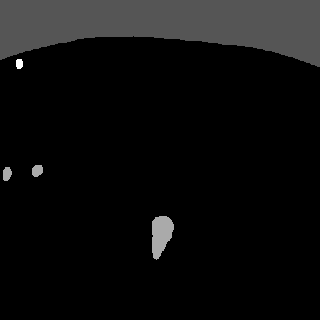

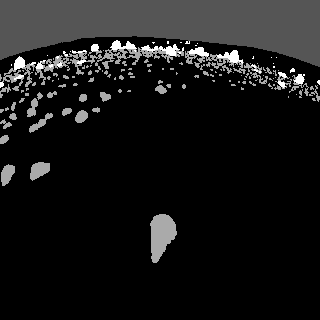

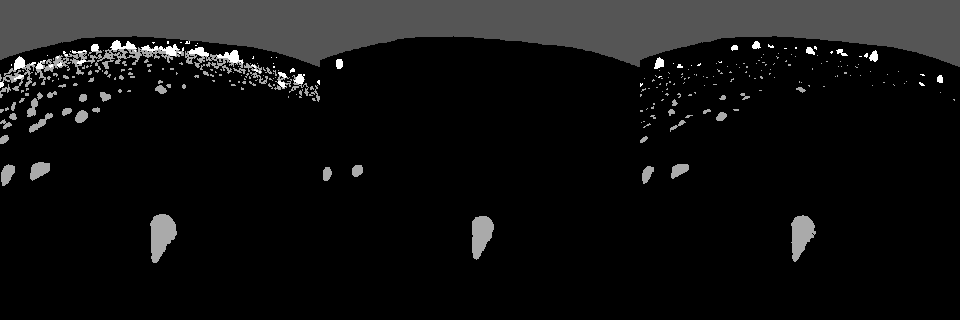

(320, 320, 1)
[0 1 2 3]


In [ ]:
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img
import PIL
from PIL import ImageOps

# auxiliary utility functions

def extract_mask_from_ground(ground_img, lower_color_threshold):
  kernel = np.ones((10,10), np.uint8)

  (R, G, B) = cv2.split(ground_img)
  R_ranged = np.clip(cv2.inRange(R, 150, 255), 0, 1)  # Value for red is hard coded as to not get problems with sky color clipping
  G_ranged = np.clip(cv2.inRange(G, lower_color_threshold, 255), 0, 2)
  B_ranged = np.clip(cv2.inRange(B, lower_color_threshold, 255), 0, 3)

  # B_ranged = cv2.morphologyEx(B_ranged, cv2.MORPH_CLOSE, kernel)  #Clipping does a good job with holes in big rocks, not needed here
  merged = cv2.merge([B_ranged, G_ranged, R_ranged])

  merged = np.expand_dims(merged, 3)
  merged = np.amax(merged, axis=2)
  return merged

# The threshold value determines how many small rocks are visible, higher threshold means less blue rocks
def load_ground(path, color_threshold):
    img_ground = cv2.imread(path)
    img_ground_rgb = cv2.cvtColor(img_ground, cv2.COLOR_BGR2RGB)
    img_ground_rgb = cv2.resize(img_ground_rgb, img_size[::-1])
    return extract_mask_from_ground(img_ground_rgb, color_threshold)

image_index = 135

# Display input image
print("Input image: ")
display(Image(filename=input_img_paths[image_index], width = 320, height = 320))

# Display auto-contrast version of corresponding target (per-pixel categories)


# Map pixel colors onto labels

print("Target img:                            Clean image:                            Cleared by me:")
merged = load_ground(target_img_paths[image_index], lower_color_threshold)
clean = load_ground(clean_target_img_paths[image_index], lower_color_threshold)
target = load_ground(ground_target_img_paths[image_index], 5)   # Anything lower than 5 looks wired

display(tf.keras.preprocessing.image.array_to_img(merged))
display(tf.keras.preprocessing.image.array_to_img(clean))
display(tf.keras.preprocessing.image.array_to_img(target))

combined = np.hstack((target, clean))
combined = np.hstack((combined, merged))

display(tf.keras.preprocessing.image.array_to_img(combined))


print(merged.shape)
print(np.unique(merged))


In [ ]:
# Prepare Sequence class to load and vectorize batches of data

class LunarLandscape(keras.utils.Sequence):
    def __init__(self, batch_size, img_size, input_img_paths, target_img_paths, color_threshold):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths
        self.color_threshold = color_threshold

    def __len__(self):
        return len(self.target_img_paths) // self.batch_size

    def __getitem__(self, idx):
        # Returns tuple (input, target) corresponding to batch idx
        i = idx * self.batch_size
        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_target_img_paths = self.target_img_paths[i : i + self.batch_size]

        # 3 Dimensional input images
        x = np.zeros((self.batch_size,) + self.img_size + (3,), dtype="float32")
        for j, path in enumerate(batch_input_img_paths):
            img = load_img(path, target_size = self.img_size)
            x[j] = img

        # 1 Dimensional target mask
        y = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_target_img_paths):
            # load ground imahe
            y[j] = load_ground(path, self.color_threshold)

        return x, y

class LunarLandscapeAgumentation(LunarLandscape):
    def __getitem__(self, idx):
        # Returns tuple (input, target) corresponding to batch idx
        i = idx * self.batch_size
        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_target_img_paths = self.target_img_paths[i : i + self.batch_size]

        # Define agumentation pipeline so the same transformation is applied on both input and mask
        seq = iaa.Sequential([
            iaa.Fliplr(0.5), # horizontal flips
            iaa.Flipud(0.5), # vertically flip 50% of all images
            iaa.Crop(percent=(0, 0.1)), # random crops
            iaa.LinearContrast((0.75, 1.5)),
        ], random_order=True)

        # 3 Dimensional input images
        x = np.zeros((self.batch_size,) + self.img_size + (3,), dtype="float32")
        # 1 Dimensional target masks
        y = np.zeros((self.batch_size,) + self.img_size + (4,), dtype="float32")  #Also here the depth is changed
        for j, path in enumerate(batch_input_img_paths):
            img = load_img(path, target_size = self.img_size)
            mask = load_ground(batch_target_img_paths[j], self.color_threshold)

            img, mask = seq(image=np.asarray(img), segmentation_maps=[mask])

            x[j] = img.astype(np.float32)

            # These two lines only for Dice loss with sm library

            # mask = tf.one_hot(mask[0], 4)
            # mask = np.squeeze(mask, axis=2)
            # print(len(mask))
            y[j] = mask[0].astype(np.float32)
            # y[j] = mask.astype(np.float32)

        return x, y

In [ ]:
import random
# Always take first 1000 images as a test set
test_samples = 1000

# Define test set input paths with corresponding targte
test_input_img_paths = input_img_paths[:test_samples]
test_target_img_paths = target_img_paths[:test_samples]

# Define test sets input paths for clean and ground masks
test_clean_target_img_paths = clean_target_img_paths [:test_samples]
test_ground_target_img_paths = ground_target_img_paths[:test_samples]

# Paths for both training and evaluation sets
val_train_input_img_paths = input_img_paths[test_samples:]
val_train_target_img_paths = target_img_paths[test_samples:]


# Split image paths into training and validation set
val_samples = 1000
random.Random(1337).shuffle(val_train_input_img_paths)
random.Random(1337).shuffle(val_train_target_img_paths)
train_input_img_paths = val_train_input_img_paths[:-val_samples]
train_target_img_paths = val_train_target_img_paths[:-val_samples]
val_input_img_paths = val_train_input_img_paths[-val_samples:]
val_target_img_paths = val_train_target_img_paths[-val_samples:]

# Instantiane data Sequences for each split
train_gen = LunarLandscapeAgumentation(
            batch_size, img_size, train_input_img_paths, train_target_img_paths, lower_color_threshold)

val_gen = LunarLandscapeAgumentation(
            batch_size, img_size, val_input_img_paths, val_target_img_paths, lower_color_threshold)

test_gen = LunarLandscape(
    batch_size, img_size, test_input_img_paths, test_target_img_paths, lower_color_threshold)

clean_test_gen = LunarLandscape(
    batch_size, img_size, test_input_img_paths, test_clean_target_img_paths, color_threshold = 0)

ground_test_gen = LunarLandscape(
    batch_size, img_size, test_input_img_paths, test_ground_target_img_paths, color_threshold = 0)

In [ ]:
#Test whether the loading class is working correctly
loader = LunarLandscapeAgumentation(
            batch_size, img_size, train_input_img_paths, train_target_img_paths, color_threshold = 100)

print(type(loader.__getitem__(3)))
print(np.unique(loader.__getitem__(1)[1][1]))
print(type(loader.__getitem__(1)[1][3][0][0][0]))
batch = loader.__getitem__(4)
display(tf.keras.preprocessing.image.array_to_img(batch[0][1]))
display(tf.keras.preprocessing.image.array_to_img(batch[1][1]))

# print(batch[0][0].shape)
# print(batch[1][0].shape)

In [ ]:
# Define model
from keras import layers

def get_unet_model(img_size, num_classes):
  model = sm.Unet(backbone_name='mobilenet', input_shape=img_size + (3, ), classes=num_classes)
  return model

def get_linknet_model(img_size, num_classes):
  model = sm.Linknet(backbone_name='mobilenetv2', input_shape= img_size + (3, ), classes=num_classes)
  return model

def get_FPN_model(img_size, num_classes):
  model = sm.FPN(backbone_name='mobilenet', input_shape = img_size + (3, ), classes=num_classes)
  return model

def get_PSPNet_model(img_size, num_classes):
  model = sm.PSPNet(backbone_name='mobilenet', input_shape = img_size + (3, ), classes=num_classes, downsample_factor=8)
  return model

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

#Build the model
# model = get_model(img_size, num_classes)
model = get_linknet_model(img_size, num_classes) # Ask how to properly change the models here
model.summary()

In [ ]:
 # Compile model -- use this one for the example on

# mlflow.tensorflow.autolog()
mlflow.autolog()

# Use this one with Unet
model.compile(
    'Adam',
    loss=sm.losses.dice_loss,
    metrics=[sm.metrics.iou_score],
)
# Define callbacks
callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    keras.callbacks.ModelCheckpoint("Linknet_mobilenetv2_320x320.h5", save_best_only=True),
]

epochs = 80
with mlflow.start_run(run_name="Linknet with mobilenetv2 backbone, threshold 100") as run:
  history = model.fit(train_gen, epochs=epochs, validation_data=val_gen, callbacks=callbacks)

run_id = run.info.run_id

In [ ]:
# Save history to file and mlflow
from  mlflow.tracking import MlflowClient
client = MlflowClient()

history_df = pd.DataFrame(history.history)
hist_csv_file = 'history.csv'
with open(hist_csv_file, mode='w') as f:
  history_df.to_csv(f)

client.log_artifact(run.info.run_id, 'history.csv')

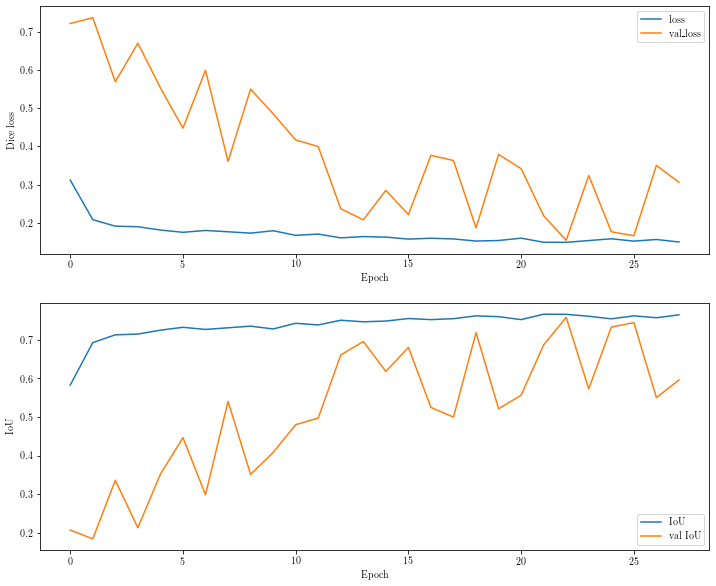

In [ ]:
# Make separate plots for loss and score
from  mlflow.tracking import MlflowClient
client = MlflowClient()

# if something goes wrong with plotting
# temp_dir = mlflow.artifacts.download_artifacts('dbfs:/databricks/mlflow-tracking/1048085717579938/fb620d96cf4146ffb92e1c2d4cca66b2/artifacts/history.csv')
# run_id = 'fb620d96cf4146ffb92e1c2d4cca66b2'


history_df = pd.read_csv('history.csv')

fig, (ax1, ax2) = plt.subplots(2, figsize=(12,10))

ax1.plot(history_df['loss'], label="loss")
ax1.plot(history_df['val_loss'], label="val_loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Dice loss")
ax1.legend()


ax2.plot(history_df['iou_score'], label="IoU")
ax2.plot(history_df['val_iou_score'], label="val IoU")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("IoU")
ax2.legend()


client.log_figure(run_id, fig, "Fitting_plots.jpg")
fig.savefig("Fitting_plots.jpg")

In [ ]:
from segmentation_models.losses  import bce_jaccard_loss
from segmentation_models.metrics import IOUScore

run_id = 0
keras.backend.clear_session()

# This line downloads models from mlflow artifacts
temp_dir = mlflow.artifacts.download_artifacts('dbfs:/databricks/mlflow-tracking/1048085717579938/42b20b7b48ee45738b3c9c36faeb4086/artifacts/model')
model = keras.models.load_model(temp_dir + '/data/model', compile=False)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 320, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 320, 320, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 326, 326, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)                 (None, 160, 160, 64  9408        ['zero_padding2d[0][0]']   

In [ ]:
from  mlflow.tracking import MlflowClient
client = MlflowClient()

converter = tf.lite.TFLiteConverter.from_saved_model(temp_dir + '/data/model') # path to the SavedModel directory
converter.optimizations = [tf.lite.Optimize.DEFAULT]

# with mlflow.start_run(run_name="LinkNet with MobileNetV2, compressed") as run:
tflite_model = converter.convert()

# run_id = run.info.run_id


# Save the model.
with open('linknet_mobilenet_compressed.tflite', 'wb') as f:
  f.write(tflite_model)

# client.log_artifact(run_id, 'linknet_mobilenetv2_compressed.tflite')

interpreter = tf.lite.Interpreter(model_content=tflite_model)
interpreter.allocate_tensors()

In [ ]:
model.save('saved_model.h5')
print("Model before quantisation: {}".format(os.path.getsize('saved_model.h5')/ float(2**20) ))
print("Model after quantisation: {}".format(os.path.getsize('linknet_mobilenet_compressed.tflite')/ float(2**20)))

Model before quantisation: 165.73015594482422
Model after quantisation: 13.914581298828125


In [ ]:
# Test compressed model 

def compressed_predict(interpreter, input_paths):
  input_index = interpreter.get_input_details()[0]["index"]
  output_index = interpreter.get_output_details()[0]["index"]
  # Run predictions on ever y image in the "test" dataset.
  predictions = []
  for i, test_image_path in enumerate(input_paths):

    if i % 100 == 0:
      print(i)
    # Pre-processing: add batch dimension and convert to float32 to match with
    # the model's input data format.
    test_image = load_img(test_image_path, target_size = img_size)
    # print(type(test_image))
    # test_image = test_image.astype(np.float32)
    test_image = np.expand_dims(test_image, axis=0).astype(np.float32)
    # print(test_image.shape)
    interpreter.set_tensor(input_index, test_image)

    # Run inference.
    interpreter.invoke()

    # Post-processing: remove batch dimension and find the digit with highest
    # probability.
    pred = interpreter.get_tensor(output_index)
    pred = pred.squeeze(axis=0)
    predictions.append(pred)


  return predictions
  # Compare prediction results with ground truth labels to calculate accuracy.
  # prediction_digits = np.array(prediction_digits)
  # accuracy = (prediction_digits == test_labels).mean()
  # return accuracy
test_preds_compressed = compressed_predict(interpreter, test_input_img_paths)
real_preds_compressed = compressed_predict(interpreter, input_real_paths)
val_preds_compressed = compressed_predict(interpreter, val_input_img_paths)
clean_test_preds_compressed =  test_preds_compressed 
ground_test_preds_compressed =  test_preds_compressed 

0
100
200
300
400
500
600
700
800
900
0
0
100
200
300
400
500
600
700
800
900


In [ ]:
from tensorflow.python import train
#Generate predictions for validation set
val_gen = LunarLandscape(batch_size, img_size, val_input_img_paths, val_target_img_paths, lower_color_threshold)
val_preds = model.predict(val_gen)

#Generate predictions for real moon images
real_gen = LunarLandscape(batch_size, img_size, input_real_paths, target_real_paths, 5)
real_preds = model.predict(real_gen)

#Generate predictions for test sets
test_preds = model.predict(test_gen)

# Generate predictions for test set with clean masks
clean_test_preds = model.predict(clean_test_gen)

# Generate predictions for test set with uncleaned masks
ground_test_preds = model.predict(ground_test_gen)

62/62 [==============================] - 17s 273ms/step


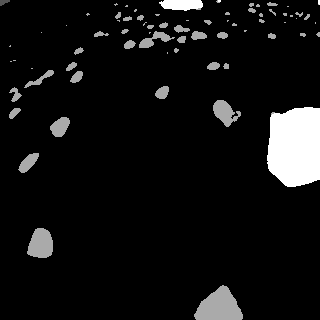

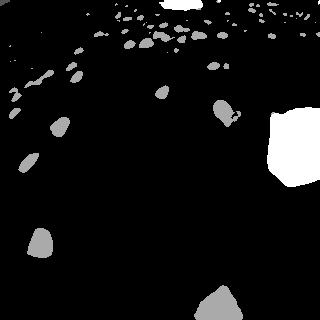

In [ ]:
def get_mask(i, preds):
    #Quick utilization to display a model's prediction

    mask = np.argmax(preds[i], axis=2)
    mask = np.expand_dims(mask, axis=-1)
    # img = PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(mask))
    return mask

display(tf.keras.preprocessing.image.array_to_img(get_mask(1, test_preds_compressed)))

display(tf.keras.preprocessing.image.array_to_img(get_mask(1, test_preds)))

In [ ]:
# Utility function for evaluating models performance with any given metric
import keras.backend as K

# Calculate dice coefficent for one input array
def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    smooth = 0.0001
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

# Calculate average dice loss for every label
def dice_coef_multilabel(y_true, y_pred, numLabels):
    dice = [0, 0, 0, 0]
    result = 0
    average = 0
    for index in range(numLabels):
        result = dice_coef(y_true[:,:,index], y_pred[:,:,index]) # @Todo: Zbierać dice score dla każdej klasy
        # print("Dice score for class {}: {}".format(index, result))
        dice[index] += result
        average += result
    return (dice, average/numLabels) # taking average

#@todo: make function for evaluating dice loss
def calculate_dice_loss(preds, target_paths, color_threshold):
  result = [0,0,0,0]
  average = []
  for i, mask in enumerate(preds):
      mask = np.argmax(mask, axis=2)
      mask = np.expand_dims(mask, axis=-1)
      target = cv2.imread(target_paths[i])
      target = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)

      target = cv2.resize(target, img_size[::-1])
      target = extract_mask_from_ground(target, color_threshold)

      #One hot encoding so the Dice coefficent works
      mask = tf.one_hot(mask, 4)
      mask = np.squeeze(mask, axis=2)
      target = tf.one_hot(target, 4)
      target = np.squeeze(target, axis=2)

      dice_coef_tuple = dice_coef_multilabel(target, mask, 4)
      average.append(dice_coef_tuple[1])
      for i, value in enumerate(dice_coef_tuple[0]):
        result[i] += value

  for i, value in enumerate(result):
    print("Dice score for class {}: {}".format(i, value/len(preds)))
  return average

# Calculate metrics for all model predictions, returns a list
def evaluate_model(preds, target_paths_here, metric, color_threshold):
  result = []
  metric.reset_states()
  for i, mask in enumerate(preds):
      mask = np.argmax(mask, axis=2)
      mask = np.expand_dims(mask, axis=-1)
      target = cv2.imread(target_paths_here[i])
      target = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)

      target = cv2.resize(target, img_size[::-1])
      target = extract_mask_from_ground(target, color_threshold)

      metric.update_state(target, mask)
      result.append(metric.result().numpy())
  return result

# Class corresponding indeces:
0. Ground
1. Sky
2. Small rock
3. Big rock

## Calculating average metrics for different sets

In [ ]:
from  mlflow.tracking import MlflowClient
client = MlflowClient()

def eval_and_log(preds, img_paths, run_id, metric_name="", color_threshold = lower_color_threshold):
  # Define metrics
  meanIoU = tf.keras.metrics.MeanIoU(num_classes=4)
  accuracy = tf.keras.metrics.Accuracy()
  rmse = tf.keras.metrics.RootMeanSquaredError()

  # Calculate metrics for validation set
  dice = np.mean(calculate_dice_loss(preds, img_paths, color_threshold))
  iou = np.mean(evaluate_model(preds, img_paths, meanIoU, color_threshold))
  accuracy =  np.mean(evaluate_model(preds, img_paths, accuracy, color_threshold))
  rmse = np.mean(evaluate_model(preds, img_paths, rmse, color_threshold))

  metrics = [accuracy, dice, iou,  rmse]

  #Log parameters with mlflow
  if run_id != 0:
    client.log_metric(run_id, "{} accuracy".format(metric_name), accuracy)
    client.log_metric(run_id, "{} iou".format(metric_name), iou)
    client.log_metric(run_id, "{} dice".format(metric_name), dice)
    client.log_metric(run_id, "{} rmse".format(metric_name), rmse)

  # Display metrics
  print("Accuracy on {} set: {}".format(metric_name, accuracy))
  print("Mean IoU on {} set: {}".format(metric_name, iou))
  print("Dice score on {} set: {}".format(metric_name, dice))
  print("RMSE on {} set: {}".format(metric_name,rmse))
  print()

  return metrics

# if run_id != 0:
# run_id = run.info.run_id

print(run_id)

val_metrics = eval_and_log(val_preds, val_target_img_paths, run_id, "val")
test_metrics = eval_and_log(test_preds, test_target_img_paths, run_id, "test")
clean_test_metrics = eval_and_log(clean_test_preds, test_clean_target_img_paths, run_id, "clean test")
ground_test_metrics = eval_and_log(ground_test_preds, test_ground_target_img_paths, run_id, "ground test")
real_metrics = eval_and_log(real_preds, target_real_paths, run_id, "real")

val_metrics_compressed = eval_and_log(val_preds_compressed, val_target_img_paths, run_id, "val")
test_metrics_compressed = eval_and_log(test_preds_compressed, test_target_img_paths, run_id, "test")
clean_test_metrics_compressed = eval_and_log(clean_test_preds_compressed, test_clean_target_img_paths, run_id, "clean test")
ground_test_metrics_compressed = eval_and_log(ground_test_preds_compressed, test_ground_target_img_paths, run_id, "ground test")
real_metrics_compressed = eval_and_log(real_preds_compressed, target_real_paths, run_id, "real")

0


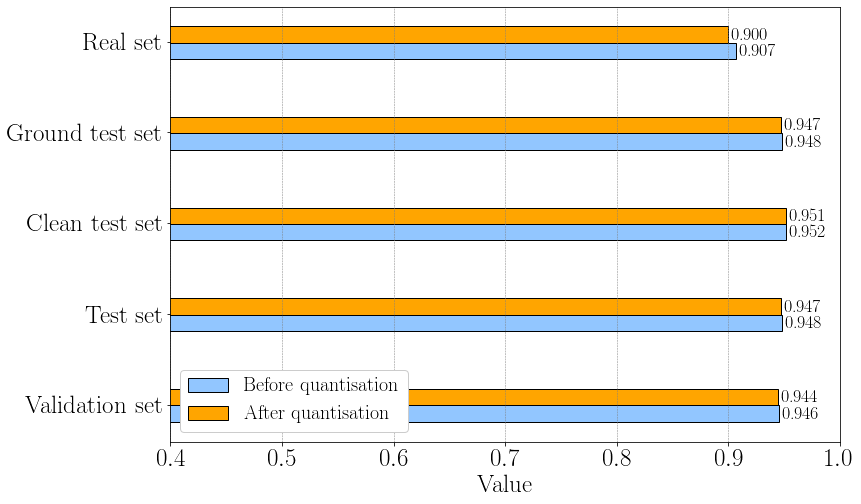

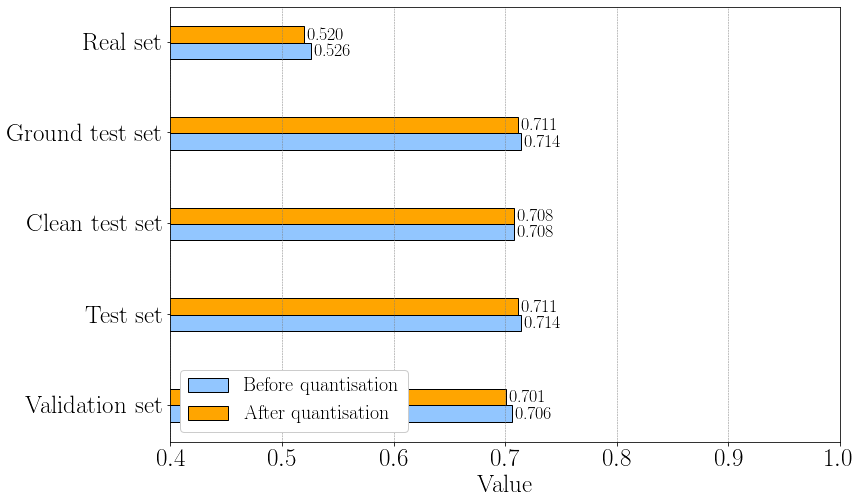

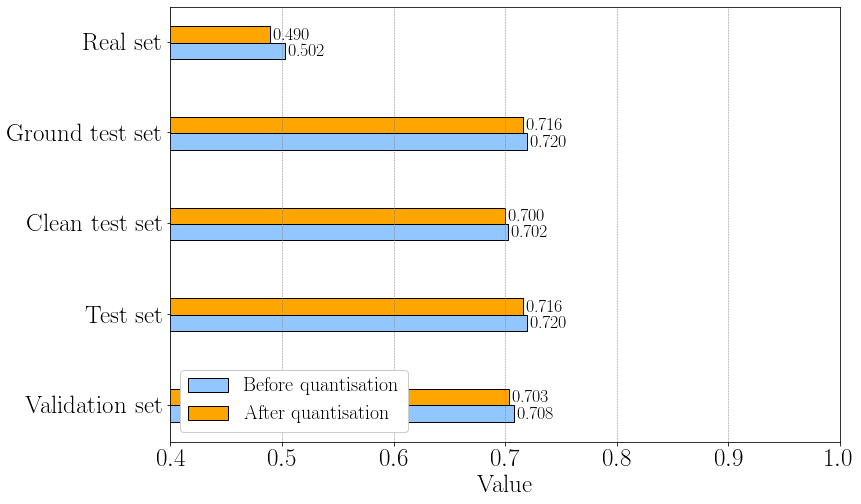

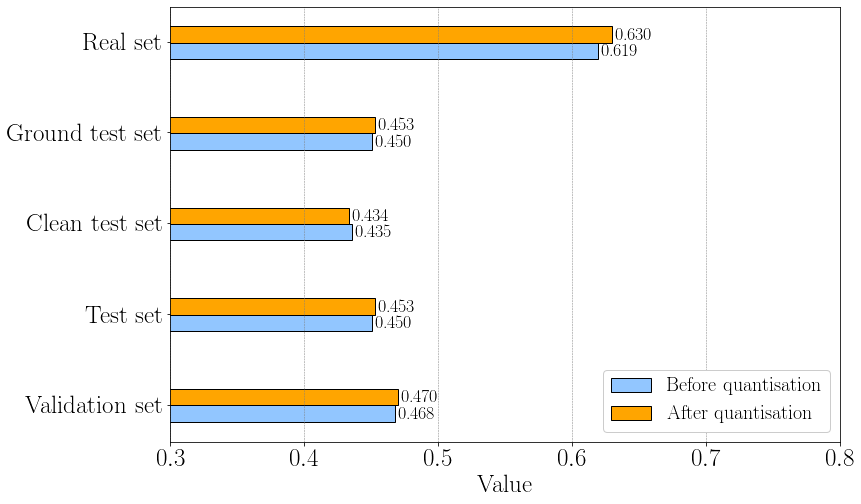

In [ ]:
height=0.18
X = np.arange(5)
sets = ['Validation set', 'Test set', 'Clean test set', 'Ground test set','Real set']
# metrics = [val_metrics, test_metrics, clean_test_metrics, ground_test_metrics, real_metrics]

metrics_names = ['MPA', 'Dice', 'IoU', 'RMSE']
metrics1 = [val_metrics, test_metrics, clean_test_metrics, ground_test_metrics, real_metrics]
metrics2 = [val_metrics_compressed, test_metrics_compressed, clean_test_metrics_compressed, ground_test_metrics_compressed, real_metrics_compressed]

mpa1 = [val_metrics[0], test_metrics[0], clean_test_metrics[0], ground_test_metrics[0], real_metrics[0]]
dice1 = [val_metrics[1], test_metrics[1], clean_test_metrics[1], ground_test_metrics[1], real_metrics[1]]
iou1 = [val_metrics[2], test_metrics[2], clean_test_metrics[2], ground_test_metrics[2], real_metrics[2]]
rmse1 = [val_metrics[3], test_metrics[3], clean_test_metrics[3], ground_test_metrics[3], real_metrics[3]]

mpa2 = [val_metrics_compressed[0], test_metrics_compressed[0], clean_test_metrics_compressed[0], ground_test_metrics_compressed[0], real_metrics_compressed[0]]
dice2 = [val_metrics_compressed[1], test_metrics_compressed[1], clean_test_metrics_compressed[1], ground_test_metrics_compressed[1], real_metrics_compressed[1]]
iou2 = [val_metrics_compressed[2], test_metrics_compressed[2], clean_test_metrics_compressed[2], ground_test_metrics_compressed[2], real_metrics_compressed[2]]
rmse2 = [val_metrics_compressed[3], test_metrics_compressed[3], clean_test_metrics_compressed[3], ground_test_metrics_compressed[3], real_metrics_compressed[3]]

metrics1 = [mpa1, dice1, iou1, rmse1]
metrics2 = [mpa2, dice2, iou2, rmse2]

for i, metric in enumerate(metrics_names):
  fig, ax = plt.subplots(figsize=(12, 8))

  rects1 = ax.barh(X, metrics1[i], height, edgecolor='k')
  rects2 = ax.barh(X + 0.18, metrics2[i], height, edgecolor='k', color='orange')

  ax.bar_label(rects1, padding=3, fmt='%0.3f', fontsize=18)
  ax.bar_label(rects2, padding=3, fmt='%0.3f', fontsize=18)

  ax.set_yticks(X + 0.1) # Move the labels a bit so it looks nicer
  ax.set_yticklabels(sets , fontsize=25)

  if metric == 'RMSE':
    ax.set(xlim=[0.3, 0.8])
    leg = ax.legend(labels=['Before quantisation', 'After quantisation'], fontsize=20, loc='lower right')
  else:
    ax.set(xlim=[0.4, 1]) 
    leg = ax.legend(labels=['Before quantisation', 'After quantisation'], fontsize=20, loc='lower left')


  ax.set(facecolor = 'White')
  ax.xaxis.grid(color='0.5', linewidth=0.5, linestyle='--', which='major')

  ax.set_xlabel('Value', fontsize=25)

  ax.tick_params(axis='both', which='major', labelsize=25)

  # leg = ax.legend(labels=['Before quantisation', 'After quantisation'], fontsize=20, loc='lower right')
  leg.get_frame().set_alpha(1)
  fig.savefig('quantisation_comparison_{}.pdf'.format(metrics_names[i]), bbox_inches='tight')  
  

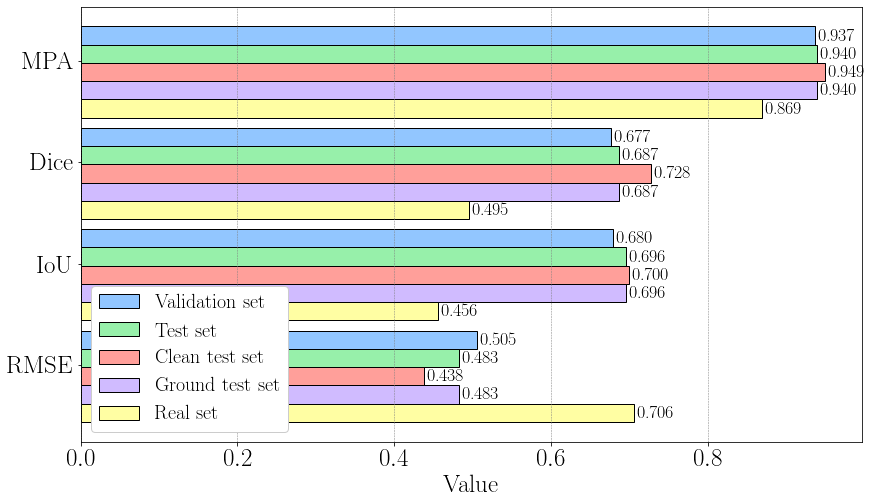

In [ ]:
# Plot the metrices on one graph
fig, ax = plt.subplots(figsize=(14, 8))

metrics_names = ['MPA', 'Dice', 'IoU', 'RMSE']

X = np.arange(4)

height=0.18

rects1 = ax.barh(X, val_metrics, height, edgecolor='k')
rects2 = ax.barh(X + 0.18, test_metrics, height, edgecolor='k')
rects3 = ax.barh(X + 0.36, clean_test_metrics, height, edgecolor='k')
rects4 = ax.barh(X + 0.54, ground_test_metrics, height, edgecolor='k')
rects5 = ax.barh(X + 0.72, real_metrics, height, edgecolor='k')


# the plot will be complete as I get this working
ax.bar_label(rects1, padding=3, fmt='%0.3f', fontsize=18)
ax.bar_label(rects2, padding=3, fmt='%0.3f', fontsize=18)
ax.bar_label(rects3, padding=3, fmt='%0.3f', fontsize=18)
ax.bar_label(rects4, padding=3, fmt='%0.3f', fontsize=18)
ax.bar_label(rects5, padding=3, fmt='%0.3f', fontsize=18)

#Get the labels
ax.set_yticks(X + 0.25) # Move the labels a bit so it looks nicer
ax.set_yticklabels(metrics_names, fontsize=25)
ax.invert_yaxis()
ax.set_xlabel('Value', fontsize=25)

ax.tick_params(axis='both', which='major', labelsize=25)

leg = ax.legend(labels=['Validation set', 'Test set', 'Clean test set', 'Ground test set','Real set'], fontsize=20, loc='lower left')
leg.get_frame().set_alpha(1)


ax.set(facecolor = 'White')
ax.xaxis.grid(color='0.5', linewidth=0.5, linestyle='--', which='major')

fig.savefig("Evaluation_Metrics.pdf")

client.log_figure(run_id, fig, "Evaluation_Metrics.pdf")

Dice score for class 0: 0.9575505342803731
Dice score for class 1: 0.907338330973868
Dice score for class 2: 0.4358896979047362
Dice score for class 3: 0.4476947567350048


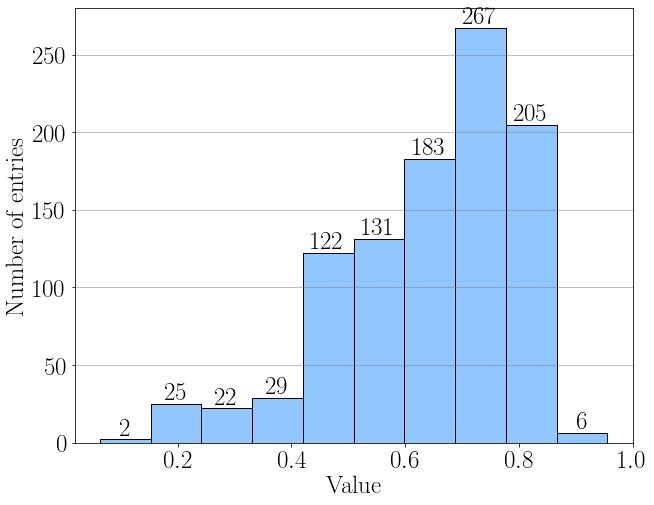

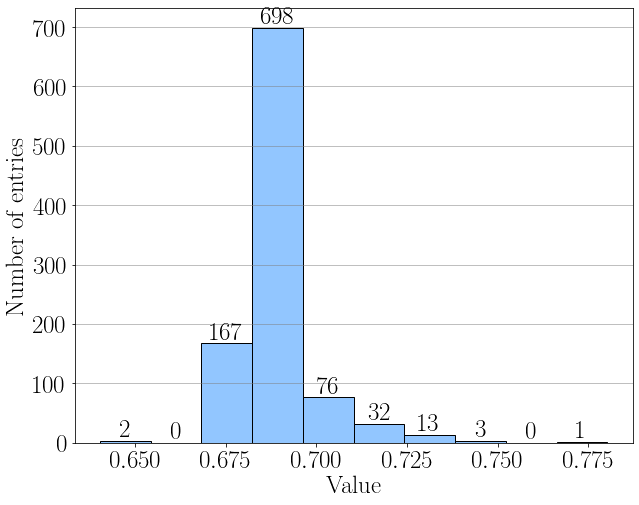

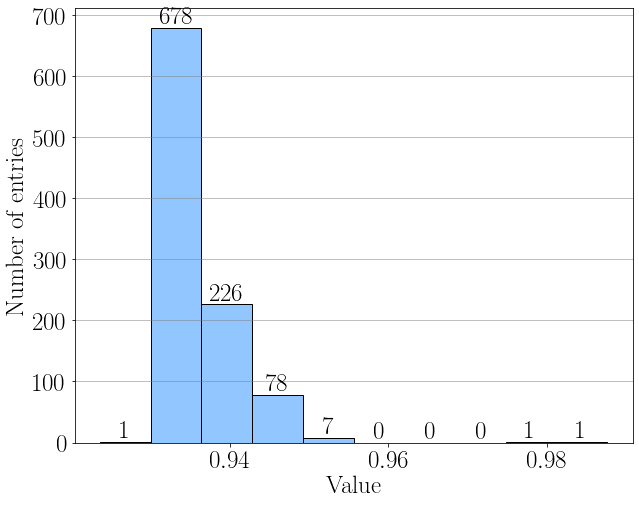

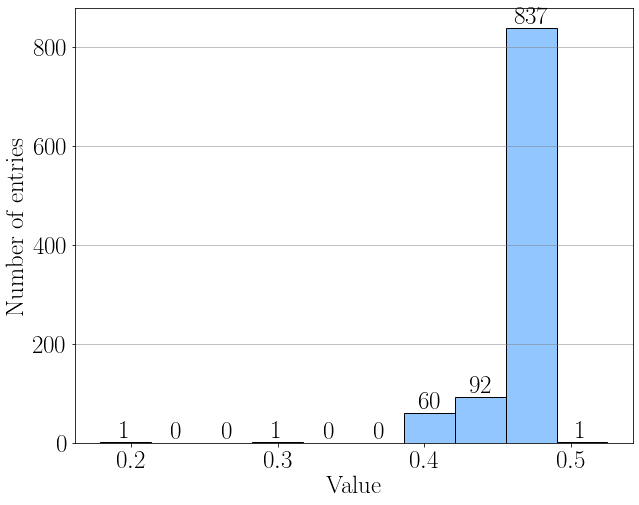

In [ ]:
def generate_histograms(preds, img_paths, run_id, figure_title="", figure_name="", color_threshold = lower_color_threshold):
  # Define metrics
  meanIoU = tf.keras.metrics.MeanIoU(num_classes=4)
  accuracy = tf.keras.metrics.Accuracy()
  rmse = tf.keras.metrics.RootMeanSquaredError()

  # # Calculate metrics for validation set
  dice_loss = calculate_dice_loss(preds, img_paths, color_threshold)
  iou = evaluate_model(preds, img_paths, meanIoU, color_threshold)
  accuracy =  evaluate_model(preds, img_paths, accuracy, color_threshold)
  rmse = evaluate_model(preds, img_paths, rmse, color_threshold)

  metrics = [dice_loss, iou, accuracy, rmse]
  metrics_names = ['Dice', 'IoU', 'MPA', 'RMSE']

  n_bins = 10
  figures = []

  for i, metric in enumerate(metrics):
    fig, ax = plt.subplots(figsize=(10,8))
    counts, edges, bars = ax.hist(metric, n_bins, edgecolor='k', align='left')
    ax.set_xlabel('Value', fontsize=25)
    ax.set_ylabel('Number of entries', fontsize=25)
    # ax.set_title(metrics_names[i], fontsize=15)
    ax.tick_params(axis='both', which='major', labelsize=25)
    plt.bar_label(bars, fontsize=25, color='k')
    ax.set(facecolor = 'White')
    ax.yaxis.grid(color='0.5', linewidth=0.5, linestyle='-', which='major')
    # ax.set_xticks(np.arange(min(metric), max(metric), 0.1))
    figures.append(fig)

  # fig.suptitle(figure_title, fontsize=16)

  #Log figureswith mlflow
  if run_id != 0:
    for i, fig in enumerate(figures):
      fig.savefig("{}_histograms_{}.pdf".format(metrics_names[i], figure_name))
      client.log_figure(run_id, fig, "{}_histograms_{}.pdf".format(metrics_names[i], figure_name))
 

# generate_histograms(val_preds, val_target_img_paths, run_id, "Validation set", "val")
generate_histograms(test_preds, test_target_img_paths, run_id, "Test set", "test")

## Finding images with highest and lowest scores of every metric in each set

Dice score for class 0: 0.9642563941416357
Dice score for class 1: 0.9313440327267295
Dice score for class 2: 0.5007433399027137
Dice score for class 3: 0.45961376133282217
Min Dice
Filename:  ./render/render0828.png


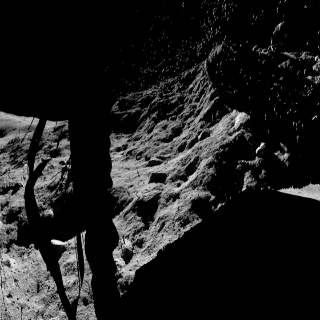

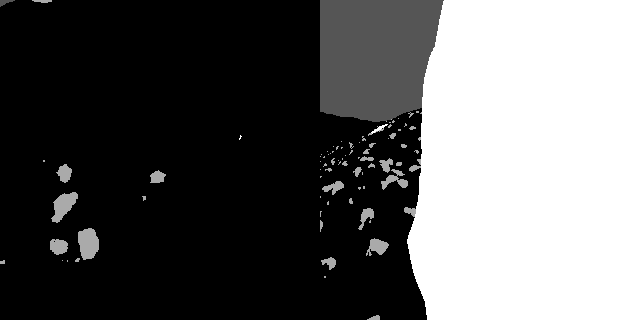

Max Dice: 
Filename:  ./render/render0237.png


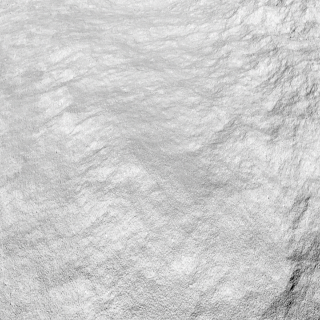

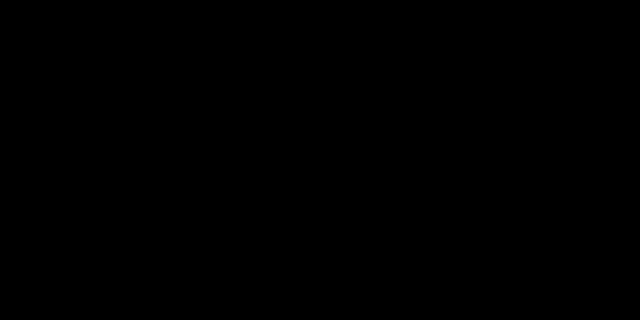

Min IoU
Filename:  ./render/render0003.png


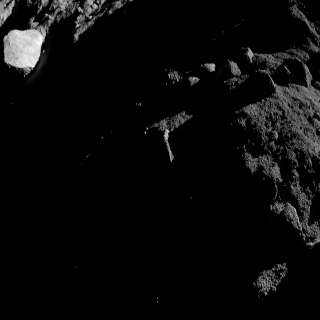

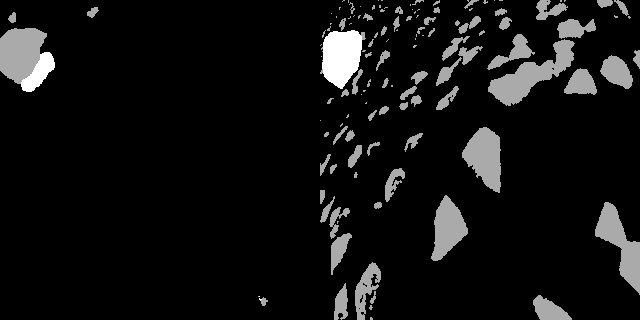

Max IoU: 
Filename:  ./render/render0001.png


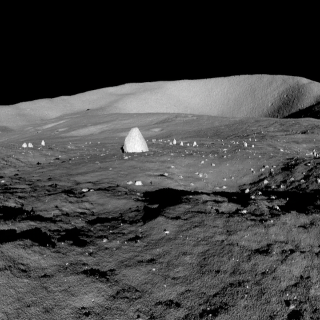

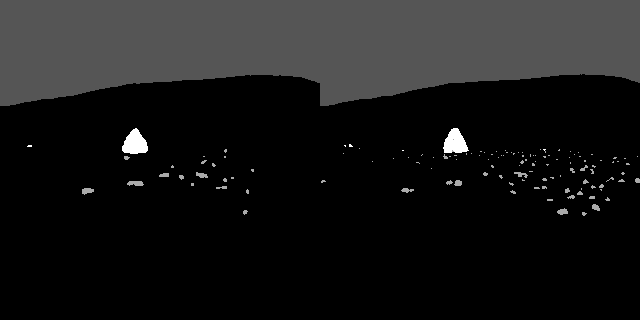

Min Accuracy
Filename:  ./render/render0003.png


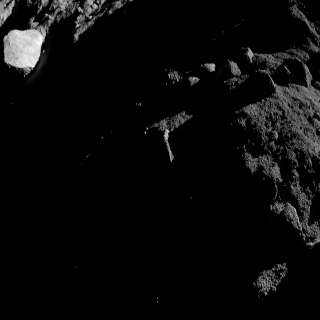

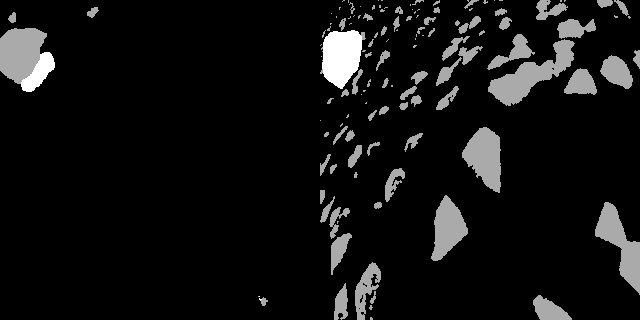

Max Accuracy: 
Filename:  ./render/render0001.png


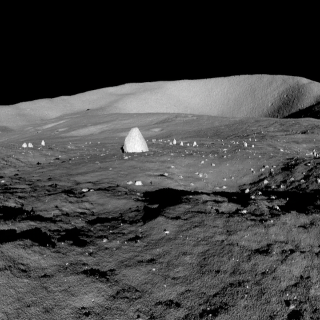

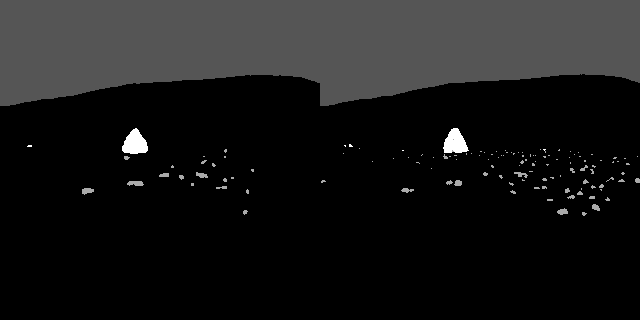

Min Rmse
Filename:  ./render/render0001.png


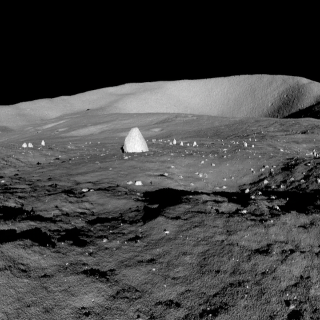

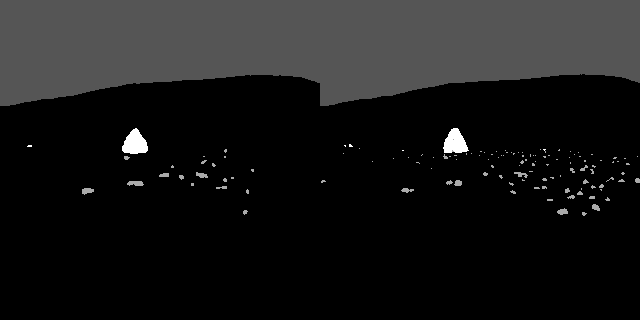

Max Rmse: 
Filename:  ./render/render0003.png


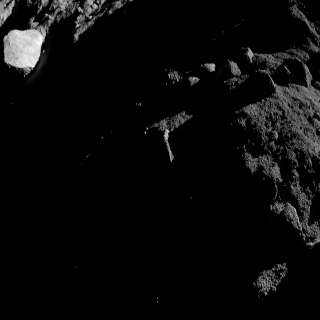

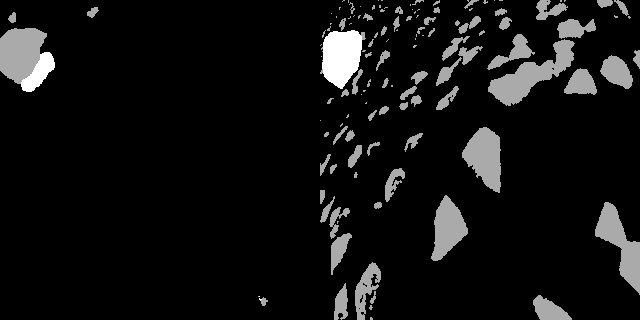

In [ ]:
def get_mask(i, preds):
    #Quick utilization to display a model's prediction

    mask = np.argmax(preds[i], axis=2)
    mask = np.expand_dims(mask, axis=-1)
    # img = PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(mask))
    return mask

def display_index(index, preds, target_img_paths, input_img_paths):
    # Display the original image
    print('Filename: ', input_img_paths[index])
    original = cv2.imread(input_img_paths[index])
    original = cv2.resize(original, img_size)
    display(tf.keras.preprocessing.image.array_to_img(original))

    # Load pred mask and target mask
    target = load_ground(target_img_paths[index], lower_color_threshold)
    pred_mask = get_mask(index, preds)
    merged = np.hstack((pred_mask, target))

    # Display masks
    display(tf.keras.preprocessing.image.array_to_img(merged))

def display_min_max(metric_name, metric, preds, target_img_paths, input_img_paths):
  # Display the image with lowest score
  print("Min {}".format(metric_name))
  display_index(np.argmin(metric), preds, target_img_paths, input_img_paths)

  # Display the image with highest score
  print("Max {}: ".format(metric_name))
  display_index(np.argmax(metric), preds, target_img_paths, input_img_paths)


def find_min_max(preds, target_img_paths, input_img_paths, color_threshold = lower_color_threshold):
  # Define metrics
  meanIoU = tf.keras.metrics.MeanIoU(num_classes=4)
  accuracy = tf.keras.metrics.Accuracy()
  rmse = tf.keras.metrics.RootMeanSquaredError()

  # Calculate metrics for validation set
  dice_loss = calculate_dice_loss(preds, target_img_paths, color_threshold)
  iou = evaluate_model(preds, target_img_paths, meanIoU, color_threshold)
  accuracy =  evaluate_model(preds, target_img_paths, accuracy, color_threshold)
  rmse = evaluate_model(preds, target_img_paths, rmse, color_threshold)

  display_min_max("Dice", dice_loss, preds, target_img_paths, input_img_paths)
  display_min_max("IoU", iou, preds, target_img_paths, input_img_paths)
  display_min_max("Accuracy", accuracy, preds, target_img_paths, input_img_paths)
  display_min_max("Rmse", rmse, preds, target_img_paths, input_img_paths)

# find_min_max(test_preds, test_target_img_paths, test_input_img_paths)
# find_min_max(val_preds, val_target_img_paths, val_input_img_paths)
find_min_max(test_preds, test_target_img_paths, test_input_img_paths)

## Plot of different metrics correspondingly to different threshold values
Color threshold values determine how many distant rocks are visible

In [ ]:
# Check the model performance on test images with different threshold value
threshold_values = []
metrics_values = []
run_id = 'c2d2e5cc41834f56ae5d6bd07e6d9403'

# Check threshold values from 10 to 250 with step 10
for value in range(10, 260, 10):
  print("Calculating for threshold value: {}".format(value))
  threshold_values.append(value) # save the value
  # loader = LunarLandscape(
  #   batch_size, img_size, test_input_img_paths, test_ground_target_img_paths, color_threshold = value)
  # preds = model.predict(loader)
  # #Logging turned off for the sake of visibility in mlflow, generated figure is enough 
  metrics_values.append(eval_and_log(test_preds_compressed, test_ground_target_img_paths, 0, "ground with value: {}".format(value), color_threshold = value))

# Save the outcome to mlflow as dataframe
color_threshold_df = pd.DataFrame(metrics_values, columns=['Accuracy', 'Dice', 'IoU', 'RMSE'])
color_threshold_df.to_csv('threshold_metrics.csv')
client.log_artifact(run_id, 'threshold_metrics.csv')


Calculating for threshold value: 10
Dice score for class 0: 0.95287120742719
Dice score for class 1: 0.9647615163856856
Dice score for class 2: 0.49243220123391007
Dice score for class 3: 0.5030361739647
Accuracy on ground with value: 10 set: 0.9379346370697021
Mean IoU on ground with value: 10 set: 0.7369685173034668
Dice score on ground with value: 10 set: 0.7282752747528716
RMSE on ground with value: 10 set: 0.5234318971633911

Calculating for threshold value: 20
Dice score for class 0: 0.959303791249662
Dice score for class 1: 0.9648505622705911
Dice score for class 2: 0.5259217926044639
Dice score for class 3: 0.5301851888747225
Accuracy on ground with value: 20 set: 0.9460352659225464
Mean IoU on ground with value: 20 set: 0.7544539570808411
Dice score on ground with value: 20 set: 0.7450653337498602
RMSE on ground with value: 20 set: 0.48631617426872253

Calculating for threshold value: 30
Dice score for class 0: 0.9629939186073542
Dice score for class 1: 0.9648951383918922
Dice

In [ ]:
temp_dir = mlflow.artifacts.download_artifacts('dbfs:/databricks/mlflow-tracking/1048085717579938/1d3ad8439094449b97c243e13928217c/artifacts/threshold_metrics.csv')
metrics_df = pd.read_csv(temp_dir)
metrics_df = metrics_df.drop('Unnamed: 0', axis=1)

threshold_values = list(range(10, 260, 10))
accuracy = metrics_df['Accuracy'].to_list()
iou = metrics_df['IoU'].to_list()
dice=metrics_df['Dice'].to_list()
rmse=metrics_df['RMSE'].to_list()

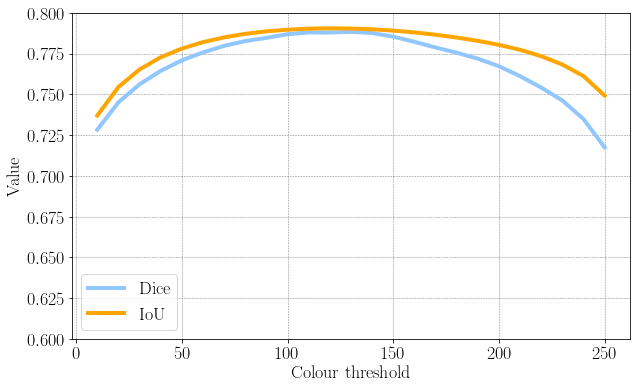

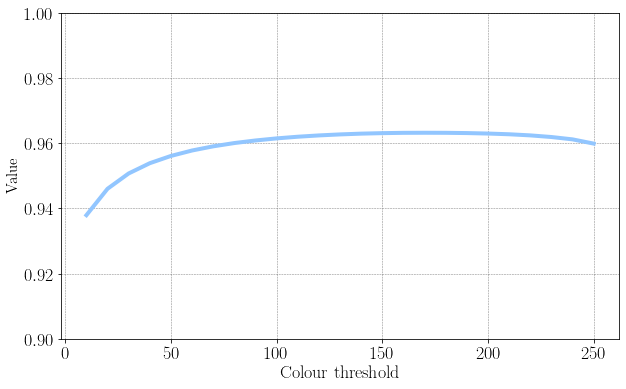

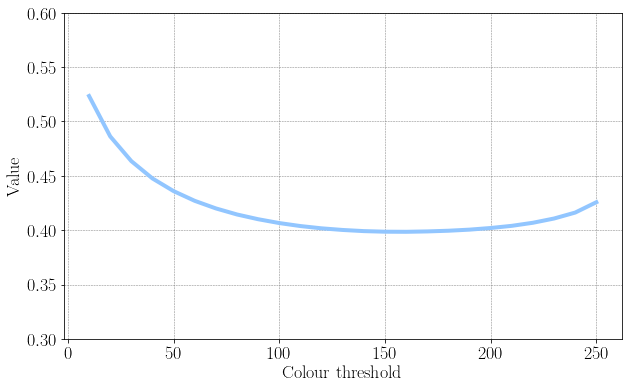

In [ ]:
# print(metrics_values)


# Adding values to every list is awful but it is the only way it works with
# this version of matplotlib
dice = []
iou = []
accuracy=[]
rmse = []
for i, metrics in enumerate(metrics_values):
  accuracy.append(metrics[0])
  dice.append(metrics[1])
  iou.append(metrics[2]) 
  rmse.append(metrics[3])

fig1, ax1 = plt.subplots(figsize=(10,6))
fig2, ax2 = plt.subplots(figsize=(10,6))
fig3, ax3 = plt.subplots(figsize=(10,6))

line = 4
ax1.plot(threshold_values, dice, label="Dice" , linewidth=line)
ax1.plot(threshold_values, iou, label="IoU", linewidth=line, color='orange')
ax2.plot(threshold_values, accuracy, linewidth=line)
ax3.plot(threshold_values, rmse, linewidth=line)

ax1.tick_params(axis='both', which='major', labelsize=18)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax3.tick_params(axis='both', which='major', labelsize=18)

# ax1.set_title("Dice and IoU", fontsize=18)
# ax2.set_title("MPA", fontsize=18)
# ax3.set_title("RMSE", fontsize=18)

ax1.legend(fontsize=18)

ax1.set_xlabel('Colour threshold', fontsize=18)
ax1.set_ylabel('Value', fontsize=18)
ax1.set(facecolor = 'White')
ax1.grid(color='0.5', linewidth=0.5, linestyle='--', which='major')
ax1.set_ylim([0.6, 0.8])

ax2.set_xlabel('Colour threshold', fontsize=18)
ax2.set_ylabel('Value', fontsize=15)
ax2.set(facecolor = 'White')
ax2.grid(color='0.5', linewidth=0.5, linestyle='--', which='major')
ax2.set_ylim([0.9, 1])

ax3.set_xlabel('Colour threshold', fontsize=18)
ax3.set_ylabel('Value', fontsize=18)
ax3.set(facecolor = 'White')
ax3.grid(color='0.5', linewidth=0.5, linestyle='--', which='major')
ax3.set_ylim([0.3, 0.6])

fig1.savefig("Threshold_plot1.pdf")
fig2.savefig("Threshold_plot2.pdf")
fig3.savefig("Threshold_plot3.pdf")

client.log_figure(run_id, fig1, "Threshold_plots_dice_iou.pdf")
client.log_figure(run_id, fig2, "Threshold_plots_accuracy.pdf")
client.log_figure(run_id, fig3, "Threshold_plots3_rmse.pdf")

# fig.legend(loc="center right", fontsize="medium")

## Show and compare results of segmentation on different input images

[0 1 2 3]


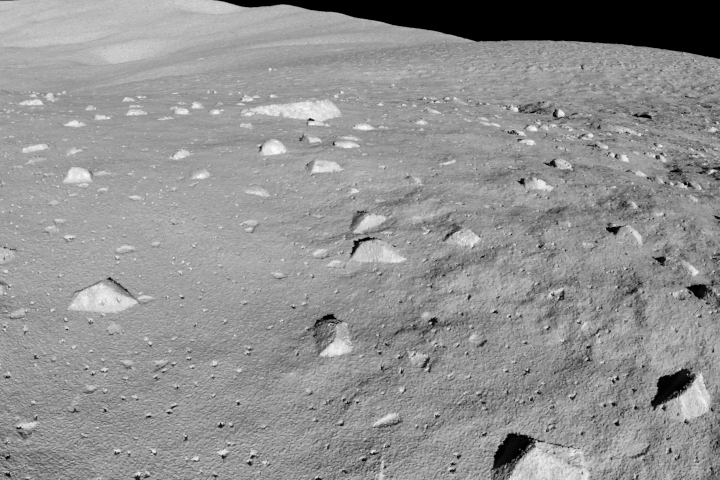

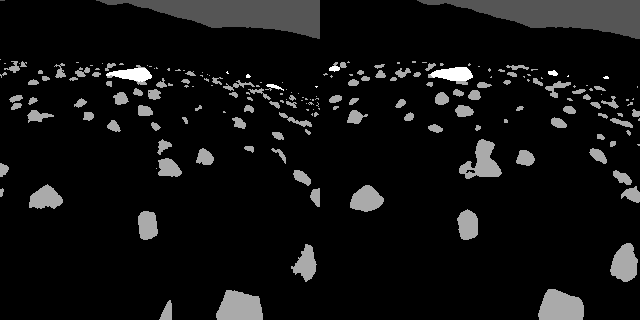

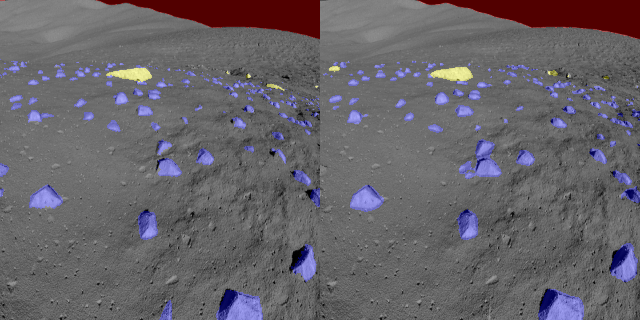

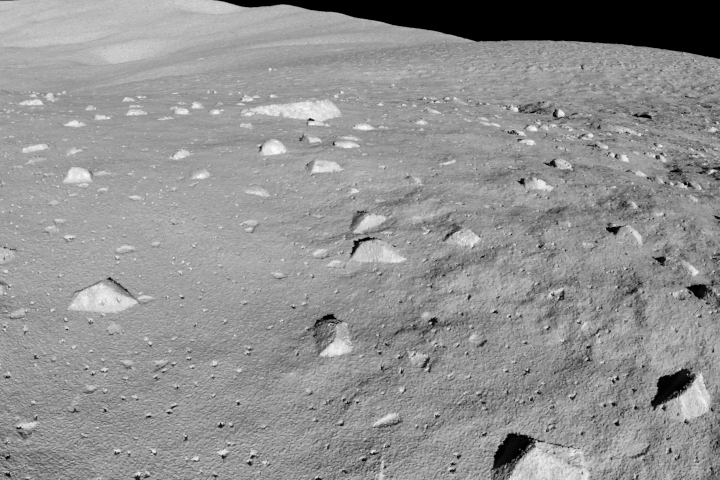

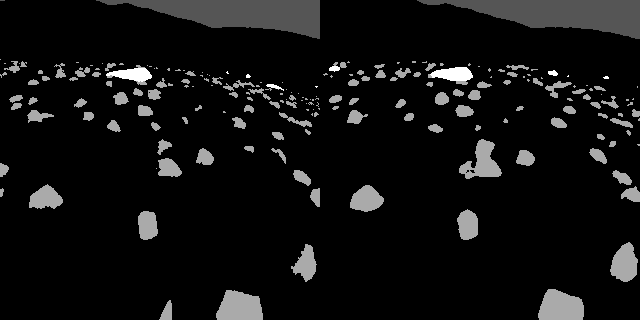

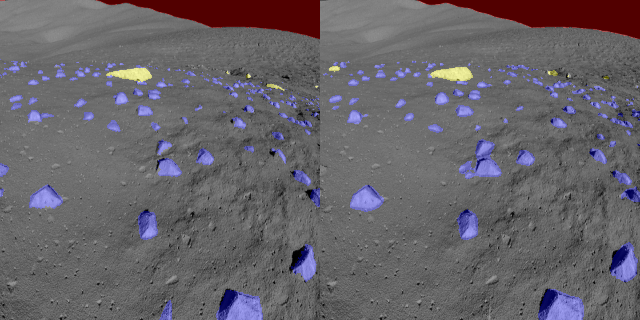

In [ ]:

# Display results for validation image with index i
i = 4

def show_results(index, input_paths, target_paths, predictions):
  # Load input image
  # print(input_paths[index])
    # print(target_paths[index])
  original = cv2.imread(input_paths[index])
  display(tf.keras.preprocessing.image.array_to_img(original))
  original = cv2.resize(original, img_size)

  #Load ground-truth target mask
  target = load_ground(target_paths[index], lower_color_threshold)

  target_img = tf.keras.preprocessing.image.array_to_img(target)


  # Display mask predicted by model
  pred_mask = get_mask(index, predictions)

  pred_mask_img = PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(pred_mask))

  # Applay segmentation mask onto real image
  final_predicted = color.label2rgb(np.asarray(pred_mask_img), original, bg_label=0)
  final_target = color.label2rgb(np.asarray(target_img), original, bg_label=0)

  # Stack segmentation masks on real images
  final = np.hstack((final_target, final_predicted))

  # Stack only masks
  pred_mask = np.hstack((target, pred_mask))
  display(PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(pred_mask)))

  display(tf.keras.preprocessing.image.array_to_img(final))

print(np.unique(np.argmax(val_preds[i], axis=2)))
show_results(i, test_input_img_paths, test_target_img_paths, test_preds)
# show_results(i, test_input_img_paths, test_target_img_paths, test_preds_compressed)

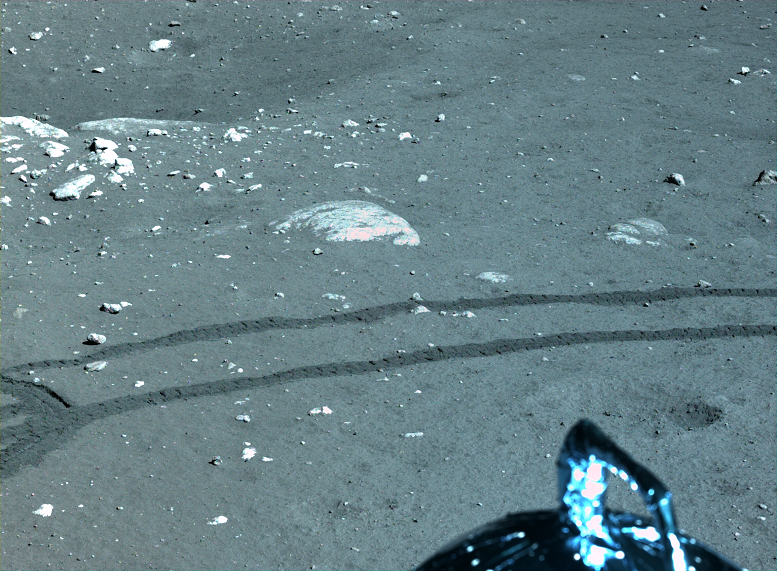

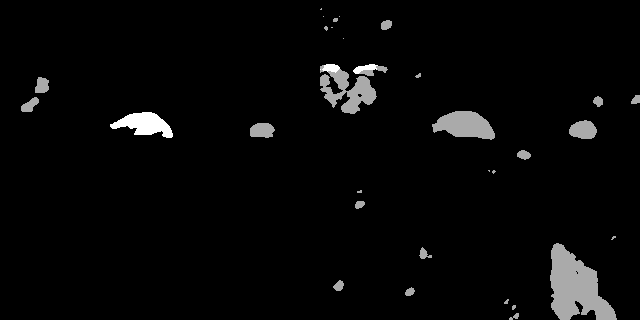

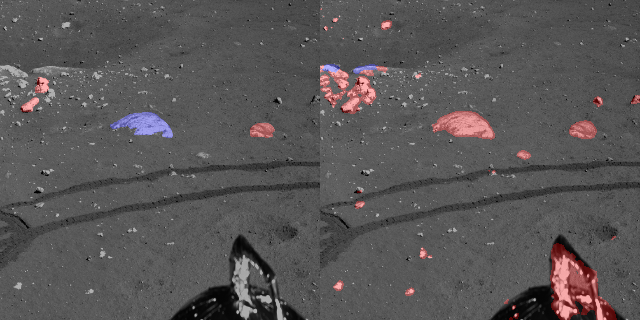

In [ ]:
show_results(15, input_real_paths, target_real_paths, real_preds)

# Visually comparing model before and after quantisation

In [ ]:
def double_metrics_calculation(preds, preds_compressed, target, color_threshold):
  # Define metrics
  meanIoU = tf.keras.metrics.MeanIoU(num_classes=4)
  accuracy_metric = tf.keras.metrics.Accuracy()
  rmse_metric = tf.keras.metrics.RootMeanSquaredError()

  metrics = []
  metrics_comporessed = []

  # Calculate metrics for test set
  dice = calculate_dice_loss(preds,  target, color_threshold)
  iou = evaluate_model(preds,  target, meanIoU, color_threshold)
  accuracy =  evaluate_model(preds,  target, accuracy_metric, color_threshold)
  rmse = evaluate_model(preds,  target, rmse_metric, color_threshold)

  metrics = [accuracy, dice, iou, rmse]

  # Calculate metrics for test set
  dice_compressed = calculate_dice_loss(preds_compressed,  target, color_threshold)
  iou_compressed = evaluate_model(preds_compressed,  target, meanIoU, color_threshold)
  accuracy_compressed =  evaluate_model(preds_compressed,  target, accuracy_metric, color_threshold)
  rmse_compressed = evaluate_model(preds_compressed,  target, rmse_metric, color_threshold)

  metrics_compressed = [accuracy_compressed, dice_compressed, iou_compressed, rmse_compressed]

  return (metrics, metrics_compressed)

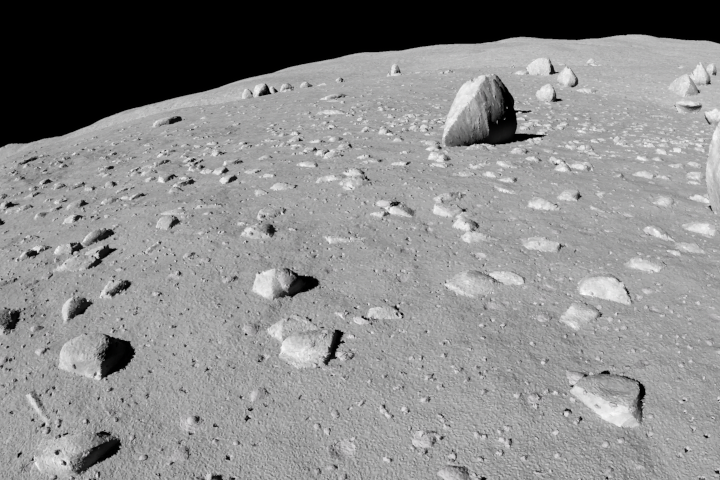

Target: 


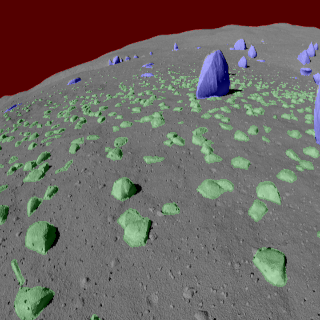

Prediction: 


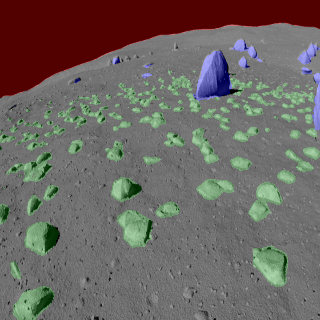

Compressed prediction: 


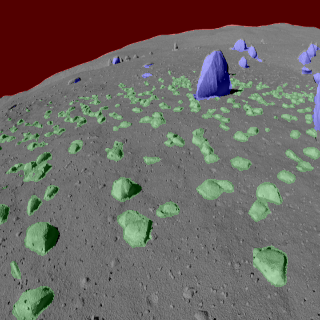

Dice score for class 0: 0.9607915637088811
Dice score for class 1: 0.9245653382984876
Dice score for class 2: 0.5759410952432515
Dice score for class 3: 0.5209602358699515
Dice score for class 0: 0.9600336020887107
Dice score for class 1: 0.9216118936081241
Dice score for class 2: 0.5781422136272801
Dice score for class 3: 0.5205328773965615
MPA:  0.9541895
MPA compressed:  0.95413476
Dice:  0.9179810103674687
Dice compressed:  0.9181681990357163
IoU:  0.7499232
IoU compressed:  0.74997216
Rmse:  0.46956387
Rmse compressed:  0.47011986


In [ ]:

# def generate_plot

def show_results_with_compressed(index, input_paths, target_paths, predictions, predictions_compressed, color_threshold):
  # Load input image
  # print(input_paths[index])
    # print(target_paths[index])
  original = cv2.imread(input_paths[index])
  display(tf.keras.preprocessing.image.array_to_img(original))
  original = cv2.resize(original, img_size)

  #Load ground-truth target mask
  target = load_ground(target_paths[index], color_threshold)

  target_img = tf.keras.preprocessing.image.array_to_img(target)

  # display(tf.keras.preprocessing.image.array_to_img(target))


  # Display mask predicted by model
  pred_mask = get_mask(index, predictions)
  pred_mask_compressed = get_mask(index, predictions_compressed)

  pred_mask_img = PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(pred_mask))
  pred_mask_cprsd_img = PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(pred_mask_compressed))

  # Applay segmentation mask onto real image
  final_predicted = color.label2rgb(np.asarray(pred_mask_img), original, bg_label=0, colors = ['red', 'green', 'blue'])
  final_prediction_cmprsd = color.label2rgb(np.asarray(pred_mask_cprsd_img), original, bg_label=0, colors = ['red', 'green', 'blue'] )
  final_target = color.label2rgb(np.asarray(target_img), original, bg_label=0, colors = ['red', 'green', 'blue'])

  # # Stack segmentation masks on real images
  # final = np.hstack((final_target, final_predicted))

  # # Stack only masks
  # pred_mask = np.hstack((target, pred_mask))
  # display(PIL.ImageOps.autocontrast(tf.keras.preprocessing.image.array_to_img(pred_mask)))

  print('Target: ')
  display(tf.keras.preprocessing.image.array_to_img(final_target))

  print('Prediction: ')
  display(tf.keras.preprocessing.image.array_to_img(final_predicted))

  print('Compressed prediction: ')
  display(tf.keras.preprocessing.image.array_to_img(final_prediction_cmprsd))



#9
i = 9
show_results_with_compressed(i, test_input_img_paths, test_target_img_paths, test_preds, test_preds_compressed, lower_color_threshold)
(metrics, metrics_compressed) =  double_metrics_calculation(test_preds, test_preds_compressed, test_target_img_paths, lower_color_threshold)

print('MPA: ', metrics[0][i])
print('MPA compressed: ', metrics_compressed[0][i])

print('Dice: ', metrics[1][i])
print('Dice compressed: ', metrics_compressed[1][i])
print('IoU: ', metrics[2][i])
print('IoU compressed: ', metrics_compressed[2][i])
print('Rmse: ', metrics[3][i])
print('Rmse compressed: ', metrics_compressed[3][i])

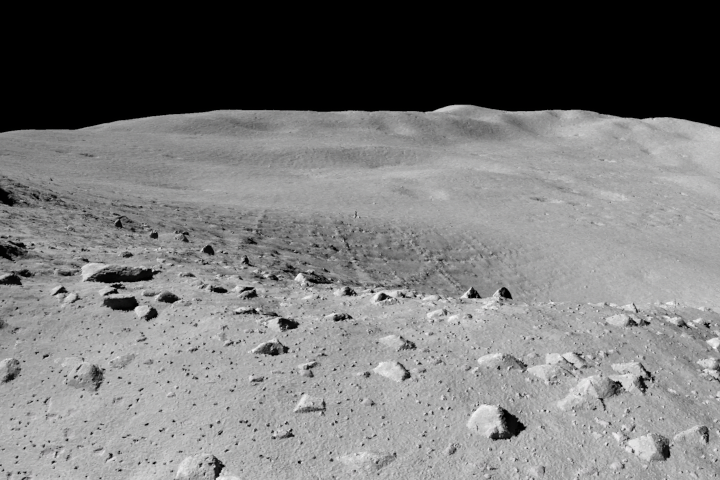

Target: 


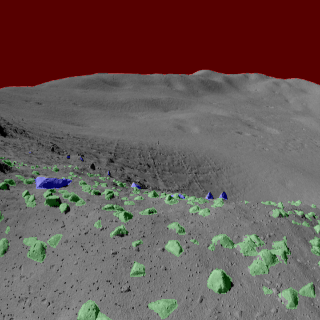

Prediction: 


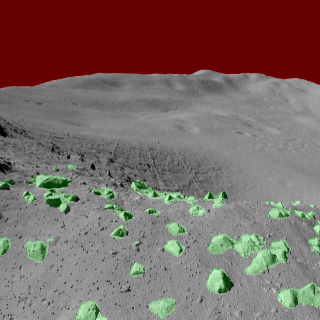

Compressed prediction: 


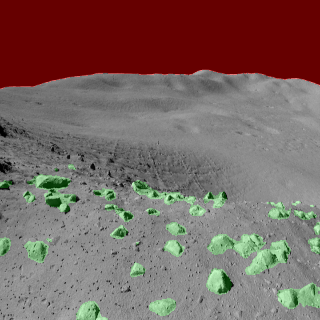

Dice score for class 0: 0.9635224300928839
Dice score for class 1: 0.9249681768767912
Dice score for class 2: 0.509253173905871
Dice score for class 3: 0.4252612441147897
Dice score for class 0: 0.9628410824846106
Dice score for class 1: 0.9190076310026883
Dice score for class 2: 0.5053801336616981
Dice score for class 3: 0.4173160037288276
MPA:  0.9412632
MPA compressed:  0.9414999
Dice:  0.6723889410201933
Dice compressed:  0.6712941878391101
IoU:  0.7192719
IoU compressed:  0.71695876
Rmse:  0.47261944
Rmse compressed:  0.47709003


In [ ]:
#validation set
i = 16
show_results_with_compressed(i, val_input_img_paths, val_target_img_paths, val_preds, val_preds_compressed, lower_color_threshold)
(metrics, metrics_compressed) =  double_metrics_calculation(val_preds, val_preds_compressed, val_target_img_paths, lower_color_threshold)

print('MPA: ', metrics[0][i])
print('MPA compressed: ', metrics_compressed[0][i])

print('Dice: ', metrics[1][i])
print('Dice compressed: ', metrics_compressed[1][i])
print('IoU: ', metrics[2][i])
print('IoU compressed: ', metrics_compressed[2][i])
print('Rmse: ', metrics[3][i])
print('Rmse compressed: ', metrics_compressed[3][i])

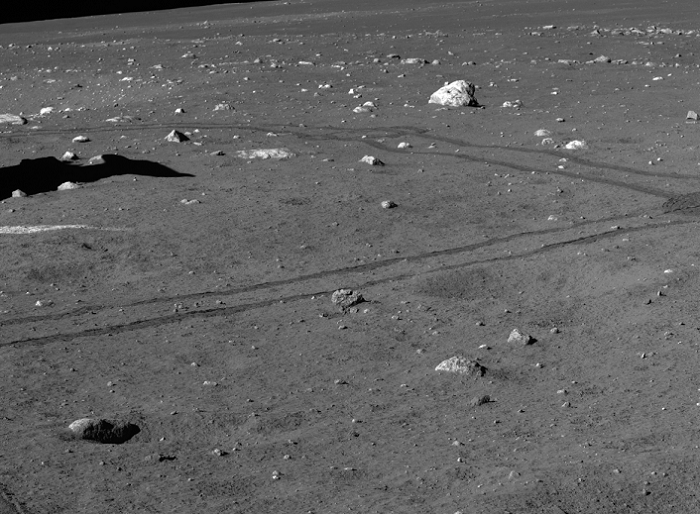

Target: 


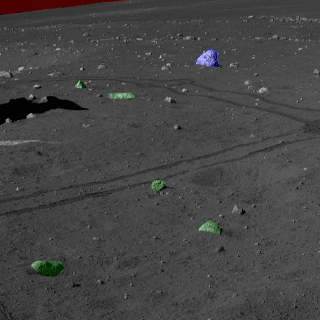

Prediction: 


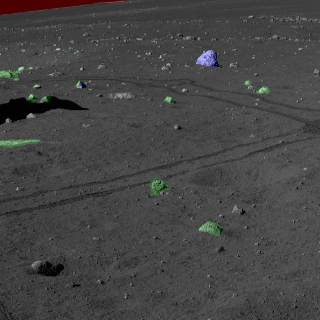

Compressed prediction: 


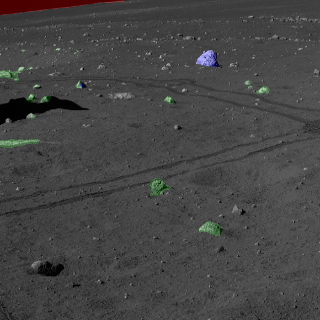

Dice score for class 0: 0.8969144173881467
Dice score for class 1: 0.7877271444018205
Dice score for class 2: 0.20093847820553834
Dice score for class 3: 0.21859016089998073
Dice score for class 0: 0.89580559390031
Dice score for class 1: 0.7896779842553067
Dice score for class 2: 0.189973858442666
Dice score for class 3: 0.2040329283491068
MPA:  0.9586328
MPA compressed:  0.95787597
Dice:  0.7726699970704559
Dice compressed:  0.7728809353193431
IoU:  0.65556514
IoU compressed:  0.6484926
Rmse:  0.42255348
Rmse compressed:  0.42265746


In [ ]:
# Real set
i = 5
show_results_with_compressed(i, input_real_paths, target_real_paths, real_preds, real_preds_compressed, lower_color_threshold)
(metrics, metrics_compressed) =  double_metrics_calculation(real_preds, real_preds_compressed, target_real_paths, lower_color_threshold)

print('MPA: ', metrics[0][i])
print('MPA compressed: ', metrics_compressed[0][i])

print('Dice: ', metrics[1][i])
print('Dice compressed: ', metrics_compressed[1][i])
print('IoU: ', metrics[2][i])
print('IoU compressed: ', metrics_compressed[2][i])
print('Rmse: ', metrics[3][i])
print('Rmse compressed: ', metrics_compressed[3][i])

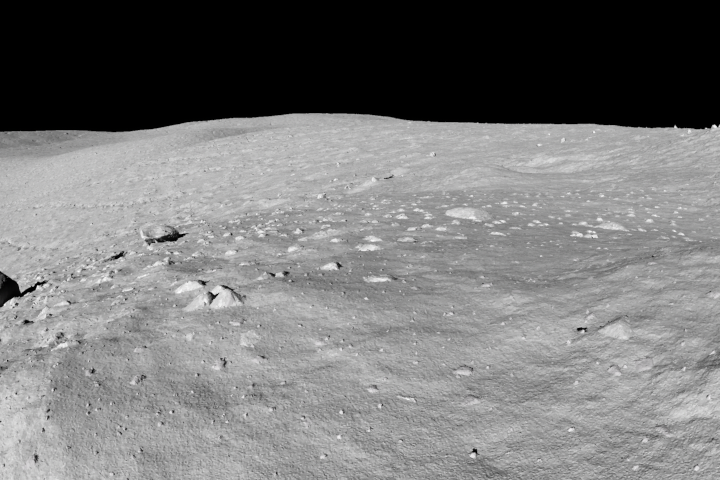

Target: 


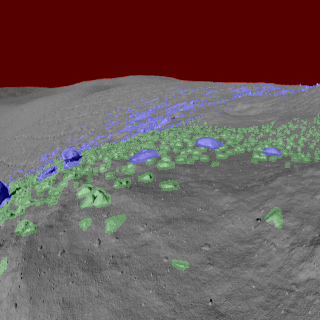

Prediction: 


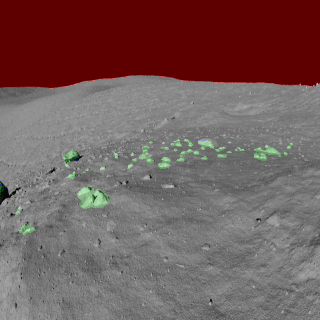

Compressed prediction: 


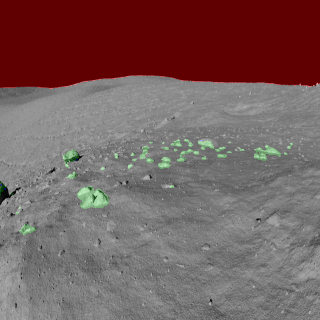

Dice score for class 0: 0.9153441883253683
Dice score for class 1: 0.9310452660301679
Dice score for class 2: 0.3435002842178528
Dice score for class 3: 0.26838579753166897
Dice score for class 0: 0.9144232815808259
Dice score for class 1: 0.924918254072955
Dice score for class 2: 0.3396034713429543
Dice score for class 3: 0.2659164686886102
MPA:  0.89715624
MPA compressed:  0.8966242
Dice:  0.5423043864274112
Dice compressed:  0.5383396742180669
IoU:  0.60522807
IoU compressed:  0.6031325
Rmse:  0.67435473
Rmse compressed:  0.6754587


In [ ]:
# ground set
i = 24
show_results_with_compressed(i, test_input_img_paths, ground_target_img_paths, test_preds, test_preds_compressed, 1)
(metrics, metrics_compressed) =  double_metrics_calculation(test_preds, test_preds_compressed, ground_target_img_paths, 1)

print('MPA: ', metrics[0][i])
print('MPA compressed: ', metrics_compressed[0][i])

print('Dice: ', metrics[1][i])
print('Dice compressed: ', metrics_compressed[1][i])
print('IoU: ', metrics[2][i])
print('IoU compressed: ', metrics_compressed[2][i])
print('Rmse: ', metrics[3][i])
print('Rmse compressed: ', metrics_compressed[3][i])

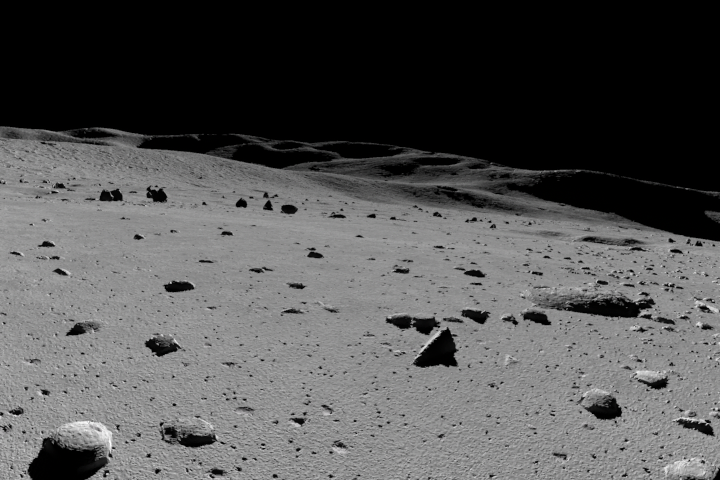

Target: 


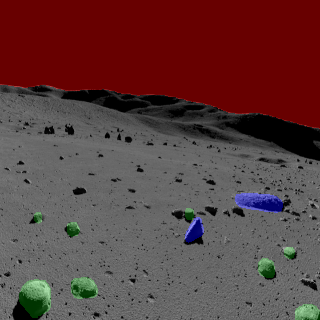

Prediction: 


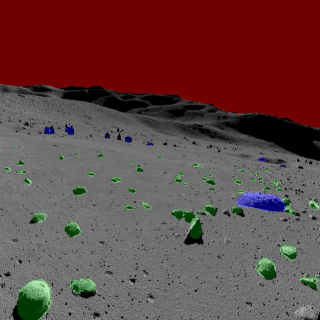

Compressed prediction: 


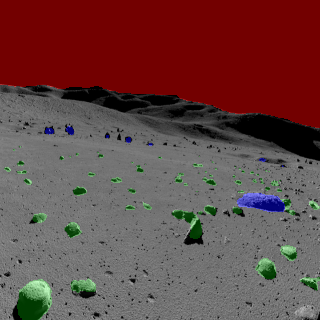

Dice score for class 0: 0.9670892315330304
Dice score for class 1: 0.931525039374097
Dice score for class 2: 0.4866860946057343
Dice score for class 3: 0.4534396357893424
Dice score for class 0: 0.9670437757031103
Dice score for class 1: 0.9253836718391222
Dice score for class 2: 0.4940171165487314
Dice score for class 3: 0.45402412637824147
MPA:  0.95497936
MPA compressed:  0.9557042
Dice:  0.8066835062404268
Dice compressed:  0.80753327545862
IoU:  0.7022227
IoU compressed:  0.70401406
Rmse:  0.39736453
Rmse compressed:  0.39249647


In [ ]:
# clean set
i = 26
show_results_with_compressed(i, test_input_img_paths, clean_target_img_paths, test_preds, test_preds_compressed, 1)
(metrics, metrics_compressed) =  double_metrics_calculation(test_preds, test_preds_compressed, clean_target_img_paths, 1)

print('MPA: ', metrics[0][i])
print('MPA compressed: ', metrics_compressed[0][i])

print('Dice: ', metrics[1][i])
print('Dice compressed: ', metrics_compressed[1][i])
print('IoU: ', metrics[2][i])
print('IoU compressed: ', metrics_compressed[2][i])
print('Rmse: ', metrics[3][i])
print('Rmse compressed: ', metrics_compressed[3][i])